In [1]:
import numpy as np
import imgaug.augmenters as iaa
import imageio
import imgaug as ia
%matplotlib inline

original


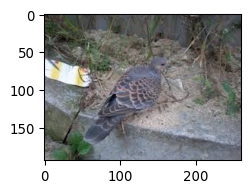

In [3]:
image = imageio.imread('pg5.jpg')
print("original")
ia.imshow(image)

In [5]:
import numpy as np
from PIL import Image
pg2 = np.asarray(Image.open("pg2.jpg"))
print("pg2 : ", np.shape(pg2))
print("pg2 : ", pg2)

pg2 :  (167, 301, 3)
pg2 :  [[[150 139 111]
  [142 130 104]
  [151 139 113]
  ...
  [113 105  82]
  [119 111  88]
  [134 126 105]]

 [[149 138 110]
  [139 127 101]
  [151 139 113]
  ...
  [112 104  81]
  [120 112  89]
  [137 129 108]]

 [[152 141 113]
  [138 126 100]
  [150 138 112]
  ...
  [143 135 112]
  [144 136 113]
  [152 144 123]]

 ...

 [[111 100  98]
  [111 100  98]
  [110  99  97]
  ...
  [107  95  71]
  [110  98  76]
  [110  99  79]]

 [[106  95  93]
  [106  95  93]
  [105  94  92]
  ...
  [104  92  68]
  [108  96  74]
  [109  98  78]]

 [[101  90  88]
  [102  91  89]
  [102  91  89]
  ...
  [102  90  66]
  [107  95  73]
  [109  98  78]]]


In [6]:
#폴더에 있는 pg1.jpg부터 pg18.jpg 까지 numpy배열로 바꾸기

for i in range(1,19):
    globals()['pg{}'.format(i)]=np.asarray(Image.open("pg%d.jpg"%i))

Augmented:


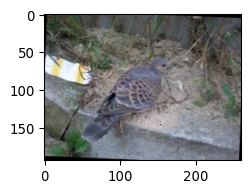

In [7]:
ia.seed(4)

rotate = iaa.Affine(rotate=(-25, 25))
image_aug = rotate(image=image)

print("Augmented:")
ia.imshow(image_aug)

Augmented batch:


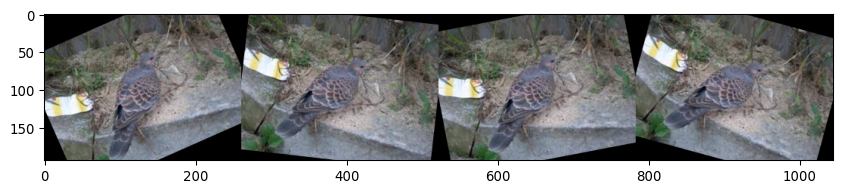

In [8]:
import numpy as np

images = [image, image, image, image]
images_aug = rotate(images=images)

print("Augmented batch:")
ia.imshow(np.hstack(images_aug))

Augmented:


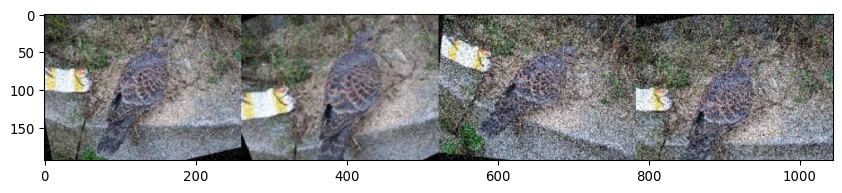

In [9]:
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),
    iaa.AdditiveGaussianNoise(scale=(10, 60)),
    iaa.Crop(percent=(0, 0.2))
])

images_aug = seq(images=images)

print("Augmented:")
ia.imshow(np.hstack(images_aug))

Augmented:


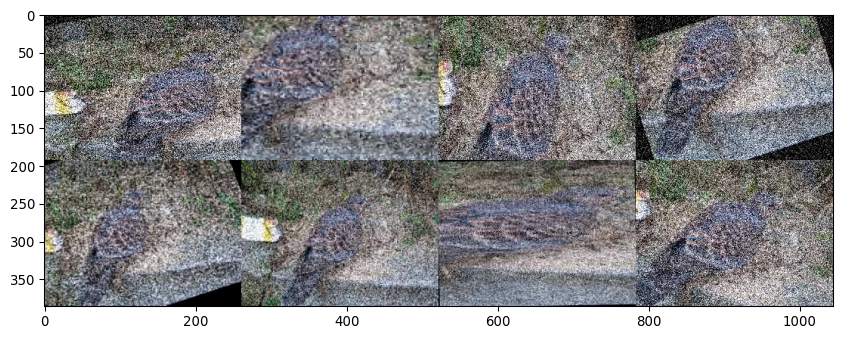

In [10]:
seq = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),
    iaa.AdditiveGaussianNoise(scale=(30, 90)),
    iaa.Crop(percent=(0, 0.4))
], random_order=True)

images_aug = [seq(image=image) for _ in range(8)]

print("Augmented:")
ia.imshow(ia.draw_grid(images_aug, cols=4, rows=2))

Augmented:


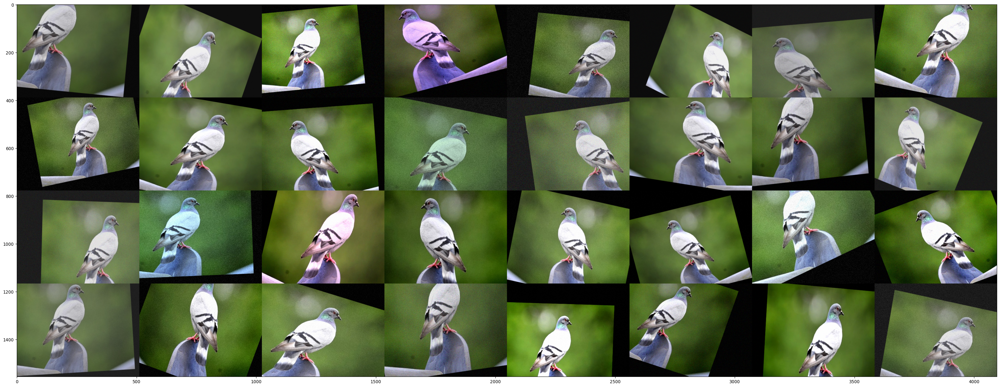

In [11]:
ia.seed(1)

# Example batch of images.
# The array has shape (32, 64, 64, 3) and dtype uint8.
images = np.array(
    [pg1 for _ in range(32)],
    dtype=np.uint8
)

seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontal flips
    iaa.Crop(percent=(0, 0.1)), # random crops
    # Small gaussian blur with random sigma between 0 and 0.5.
    # But we only blur about 50% of all images.
    iaa.Sometimes(
        0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    # Strengthen or weaken the contrast in each image.
    iaa.LinearContrast((0.75, 1.5)),
    # Add gaussian noise.
    # For 50% of all images, we sample the noise once per pixel.
    # For the other 50% of all images, we sample the noise per pixel AND
    # channel. This can change the color (not only brightness) of the
    # pixels.
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    # Apply affine transformations to each image.
    # Scale/zoom them, translate/move them, rotate them and shear them.
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-25, 25),
        shear=(-8, 8)
    )
], random_order=True) # apply augmenters in random order

images_aug = seq(images=images)
print("Augmented:")
ia.imshow(ia.draw_grid(images_aug, cols=4, rows=4))



In [12]:
##여기서부터 실전 시작##

#참고사이트#
#https://github.com/aleju/imgaug#documentation
#https://junyoung-jamong.github.io/machine/learning/2019/01/23/%EB%B0%94%EC%9A%B4%EB%94%A9%EB%B0%95%EC%8A%A4%EB%A5%BC-%ED%8F%AC%ED%95%A8%ED%95%9C-%EC%9D%B4%EB%AF%B8%EC%A7%80-%EC%A6%9D%ED%8F%AD%EC%8B%9C%ED%82%A4%EA%B8%B0-with-imgaug.html

In [13]:
import xml.etree.ElementTree as ET
##boundingbox를 정해놓았기때문에 xml도 읽어와야한다.

#annotation(xml 주석) 파싱 코드 만들기
def read_anntation(xml_file: str):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    bounding_box_list = []
#xml이 가리키는 jpg의 filename 찾기
    file_name = root.find('filename').text
    for obj in root.iter('object'):
#위에 해당하는 file의 xml에 있는 이름,bounding box 좌표 찾기
        object_label = obj.find("name").text
        for box in obj.findall("bndbox"):
            x_min = int(box.find("xmin").text)
            y_min = int(box.find("ymin").text)
            x_max = int(box.find("xmax").text)
            y_max = int(box.find("ymax").text)
#label, 좌표를 변수에 담기
        bounding_box = [object_label, x_min, y_min, x_max, y_max]
        bounding_box_list.append(bounding_box)

    return bounding_box_list, file_name

In [14]:
from os import listdir
import cv2
import numpy as np
#dir에 있는 jpg와 xml 불러오기
def read_train_dataset(dir):
    images = []
    annotations = []

    for file in listdir(dir):
        if 'jpg' in file.lower() or 'png' in file.lower():
            images.append(cv2.imread(dir + file, 1))
            annotation_file = file.replace(file.split('.')[-1], 'xml')
            bounding_box_list, file_name = read_anntation(dir + annotation_file)
            annotations.append((bounding_box_list, annotation_file, file_name))
#images를 array형태로 변환
    images = np.array(images)

    return images, annotations

In [ ]:
import imgaug as ia
from imgaug import augmenters as iaa
from files import *

ia.seed(1)

dir = 'Augmentation/'
images, annotations = read_train_dataset(dir)

for idx in range(len(images)):
    image = images[idx]
    boxes = annotations[idx][0]

    ia_bounding_boxes = []
    for box in boxes:
        ia_bounding_boxes.append(ia.BoundingBox(x1=box[1], y1=box[2], x2=box[3], y2=box[4]))
    bbs = ia.BoundingBoxesOnImage(ia_bounding_boxes, shape=image.shape)

    ## 아래 부분을 수정하여 augmentation 가능###
    seq = iaa.Sequential([
        iaa.Multiply((1.2, 1.5)),
        iaa.Affine(
            translate_px={"x": 40, "y": 60},
            scale=(0.5, 0.7)
        )
    ])

    seq_det = seq.to_deterministic()

    image_aug = seq_det.augment_images([image])[0]
    bbs_aug = seq_det.augment_bounding_boxes([bbs])[0]

    for i in range(len(bbs.bounding_boxes)):
        before = bbs.bounding_boxes[i]
        after = bbs_aug.bounding_boxes[i]
        print("BB %d: (%.4f, %.4f, %.4f, %.4f) -> (%.4f, %.4f, %.4f, %.4f)" % (
            i,
            before.x1, before.y1, before.x2, before.y2,
            after.x1, after.y1, after.x2, after.y2)
        )

    image_before = bbs.draw_on_image(image, thickness=20)
    image_after = bbs_aug.draw_on_image(image_aug, thickness=20, color=[0, 0, 255])

    cv2.imshow('image_before', cv2.resize(image_before, (380, 640)))
    cv2.imshow('image_after', cv2.resize(image_after, (380, 640)))

    cv2.waitKey(0)

In [36]:
import imgaug as ia
from imgaug import augmenters as iaa
from files import *
from pascal_voc_writer import Writer

ia.seed(1)

dir = 'Augmentation/'
images, annotations = read_train_dataset(dir)

for idx in range(len(images)):
    image = images[idx]
    boxes = annotations[idx][0]

    ia_bounding_boxes = []
    for box in boxes:
        ia_bounding_boxes.append(ia.BoundingBox(x1=box[1], y1=box[2], x2=box[3], y2=box[4]))

    bbs = ia.BoundingBoxesOnImage(ia_bounding_boxes, shape=image.shape)

    seq = iaa.Sequential([
        iaa.Jigsaw(nb_rows=10, nb_cols=10, max_steps=(1, 5))
    ])

    seq_det = seq.to_deterministic()

    image_aug = seq_det.augment_images([image])[0]
    bbs_aug = seq_det.augment_bounding_boxes([bbs])[0]

    new_image_file = dir + '10_' + annotations[idx][2]
    cv2.imwrite(new_image_file, image_aug)

    h, w = np.shape(image_aug)[0:2]
    voc_writer = Writer(new_image_file, w, h)

    for i in range(len(bbs_aug.bounding_boxes)):
        bb_box = bbs_aug.bounding_boxes[i]
        voc_writer.addObject(boxes[i][0], int(bb_box.x1), int(bb_box.y1), int(bb_box.x2), int(bb_box.y2))

    voc_writer.save(dir + '10_' + annotations[idx][1])

c:\users\user\anaconda3\envs\tensorflow2\lib\site-packages\ipykernel_launcher.py:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  app.launch_new_instance()


NotImplementedError: Jigsaw currently only supports augmentation of images, heatmaps, segmentation maps and keypoints. Explicitly not supported are: bounding boxes, polygons and line strings.